# Домашнее задание.
    Потренируем навыки, полученные на практическом занятии. Пользуясь новыми знаниями, проведите эксплоративный анализ данных на данных недвижимости Бостона, и попытайтесь обучить линейную модель наиболее качественно.
    Все ваши действия и решения описывайте в markdown.Данные вы сможете получить исполнив следующий код:
    
from sklearn.datasets import load_boston<br>import pandas as pd<br>data =  pd.read_csv(load_boston()['filename'], skiprows=1)

    Переменная, которую надо предсказать - ’MEDV’.
    Прочитать информацию о содержимом датасета:
print(load_boston()['DESCR'])

    Если вы неудовлетворенны результатом, но лучшего решения предложить не можете, то высылайте задание на проверку.Цель задания - закрепить полученные навыки.

In [1]:
from sklearn.datasets import load_boston
import pandas as pd
data =  pd.read_csv(load_boston()['filename'], skiprows=1)

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [4]:
print(load_boston()['DESCR'])

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

Фактор Значение  
CRIM   Уровень преступности (Crime rate)  
ZN	   Доля участков площадью более 25 000 кв. футов, занятых жилыми помещениями  (Percentage of residential land zoned for lots over 25,000 ft2)  
INDUS	Доля территории, занятой бизнес-структурами, кроме розничной торговли (Percentage of land occupied by nonretail business)  
CHAS	Наличие выхода к реке Чарльз (1 или 0) (Does tract bound Charles River (= 1 if tract bounds river, = 0 otherwise))  
NOX	Концентрация оксида азота (частиц на 10 миллионов ед.) (Nitric oxide concentration (parts per 10 million))  
RM  Среднее количество комнат в доме (Average number of rooms per dwelling)  
AGE	Процент жилья постройки до 1940 года, занимаемых собственником (Percentage of owner-occupied units built prior to 1940)  
DIS	Взвешенные расстояния до пяти бостонских центров занятости (Weighted distances to five Boston employment centers)  
RAD	Индекс доступности радиальных магистралей (Index of accessibility to radial highways)  
TAX	Ставка налога на стоимость имущества (за 10 000 долларов США) (Full-value property tax rate per 10,000)  
PTRATIO Соотношение численности учащихся и преподавателей (Pupil-to-teacher ratio by town)  
LSTAT	 Процент населения с низким социальным статусом (Percentage of lower status of the population)  
B: Это рассчитывается как 1000(Bk — 0.63)², где Bk -
 доля лиц афроамериканского происхождения по городу  
MEDV  Средняя (медианная) стоимость домов, занимаемых владельцами, в $ 1000 (MEDV Median value of owner-occupied homes in 1000s)

In [5]:
type(data)

pandas.core.frame.DataFrame

In [6]:
data.tail()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0
505,0.04741,0.0,11.93,0,0.573,6.030,80.8,2.5050,1,273,21.0,396.90,7.88,11.9


In [7]:
data.shape

(506, 14)

In [8]:
data.keys()

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'MEDV'],
      dtype='object')

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
CRIM       506 non-null float64
ZN         506 non-null float64
INDUS      506 non-null float64
CHAS       506 non-null int64
NOX        506 non-null float64
RM         506 non-null float64
AGE        506 non-null float64
DIS        506 non-null float64
RAD        506 non-null int64
TAX        506 non-null int64
PTRATIO    506 non-null float64
B          506 non-null float64
LSTAT      506 non-null float64
MEDV       506 non-null float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


In [10]:
data.describe(include='all')

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677082,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [11]:
data.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

In [27]:
pip install --user pandas-profiling

Note: you may need to restart the kernel to use updated packages.


In [13]:
import pandas_profiling
data.profile_report()

Приметим, что атрибуты 'TAX' и 'RAD' сильно скоррелированы (согласно отчёту высветилось в предупреждениях). Один из атрибутов впоследствии можно удалить (ниже я ещё раз отдельно вычислю матрицу корреляции и приведу тепловую карту).

Из data.describe можно обнаружить, например для атрибута CRIM сильные выбросы. Это например видно, если посмотреть среднее значение и минимум с максимумом.

In [10]:
import statistics
print(statistics.mean(data['CRIM']))
print(min(data['CRIM']))
print(max(data['CRIM']))

3.613523557312253
0.00632
88.9762


Видно, что несколько значений имеют намного большие значения, чем большинство. Так можно сказать и о других атрибутах. Нарисуем ящик с усами двумя способами.

1-й способ

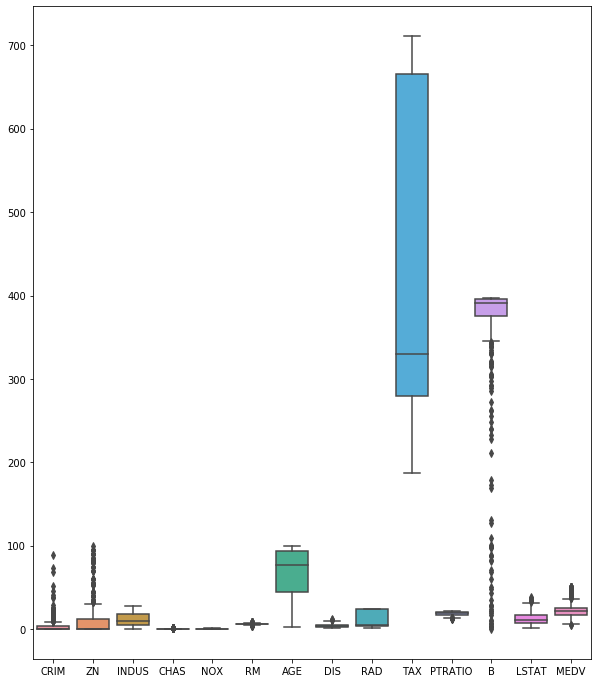

In [12]:
plt.figure(figsize=(10, 12))
sns.boxplot(data=data)

2-й способ (каждый отдельно, в цикле, и горизонтально)

In [12]:
data.columns

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'MEDV'],
      dtype='object')

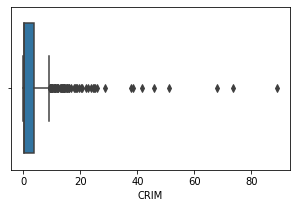

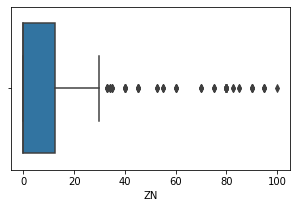

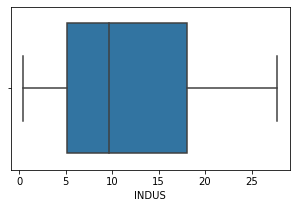

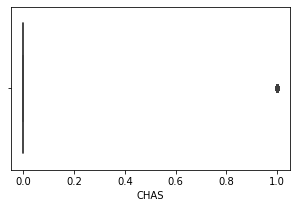

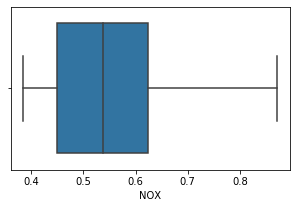

...

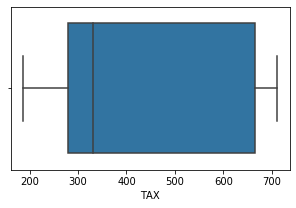

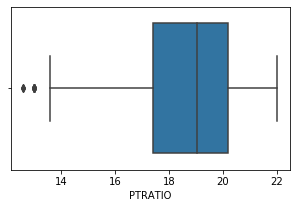

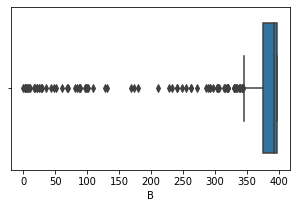

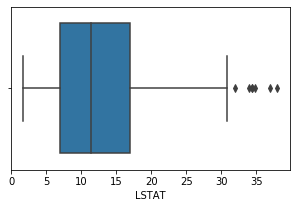

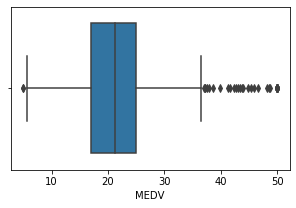

In [13]:
for i in data.columns:
    plt.figure(figsize=(5,3))
    sns.boxplot(x=data[i])

Видно, что много переменных нуждаются в чистке. Сделаем копию данных, и у нас будут два датафрейма. Первоначальный и, скажем так, учебный.

In [14]:
boston=data.copy()

Пока, что находится выше по строчкам, относится, как к датафрейму boston, так и датафрейму data. **Будем производить учебный feature engineering над датафреймом boston**.

В следующем блоке заменим выходящие за определённые границы данные nan значением, и посчитаем количество.

In [16]:
for i in boston.columns:
    q75,q25=np.percentile(boston.loc[:,i],[75,25])
    iqr=q75-q25
    min=q25-(iqr*1.5)
    max=q75+(iqr*1.5)
    boston.loc[boston.loc[:,i]<min,i]=np.nan
    boston.loc[boston.loc[:,i]>max,i]=np.nan
    print(i, ', отсутствующих значений:', boston.loc[:,i].isnull().sum())

CRIM , отсутствующих значений: 66
ZN , отсутствующих значений: 68
INDUS , отсутствующих значений: 0
CHAS , отсутствующих значений: 35
NOX , отсутствующих значений: 0
RM , отсутствующих значений: 30
AGE , отсутствующих значений: 0
DIS , отсутствующих значений: 5
RAD , отсутствующих значений: 0
TAX , отсутствующих значений: 0
PTRATIO , отсутствующих значений: 15
B , отсутствующих значений: 77
LSTAT , отсутствующих значений: 7
MEDV , отсутствующих значений: 40


Для некоторых атрибутов не было выбросов, вот и по-прежнему для этих атрибутов нет отсутствующих значений. Но, следующим шагом заменим образовавшиеся nan среднем значением атрибута.

## Заполнение отсутствующих  значений.

In [18]:
#Вычислим отсутствующие значения для каждого атрибута.
cdf=pd.DataFrame(boston.isnull().sum())
cdf=cdf.sort_values(0, ascending=False)
cdf=cdf.rename(columns={0:'отсутствующие значения'})
print(cdf)

         отсутствующие значения
B                            77
ZN                           68
CRIM                         66
MEDV                         40
CHAS                         35
RM                           30
PTRATIO                      15
LSTAT                         7
DIS                           5
INDUS                         0
NOX                           0
AGE                           0
RAD                           0
TAX                           0


In [19]:
#Замена всех выброшенных значений средними значениями датасета boston
#Среднее теперь не учитывает те самые выброшенные значения
for i in boston.columns:
    boston[i]=boston[i].fillna(boston[i].mean())

Убедимся, что нет теперь nan значений.

In [20]:
boston.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

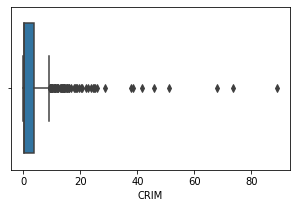

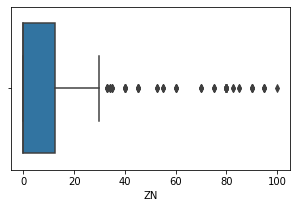

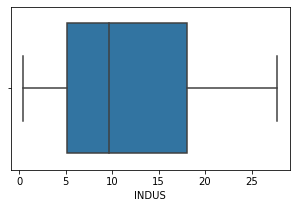

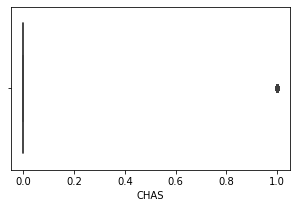

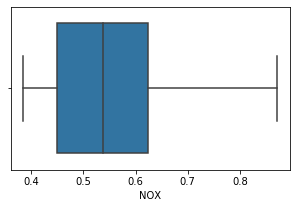

...

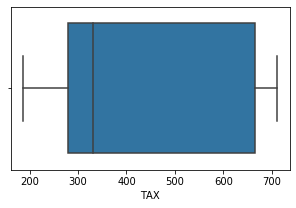

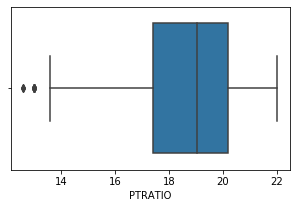

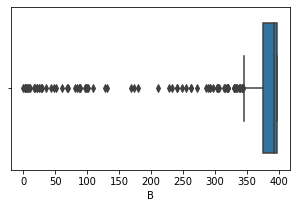

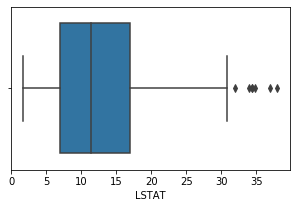

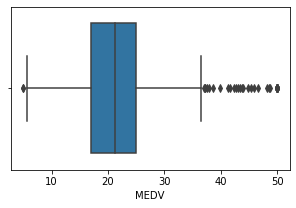

In [21]:
for i in boston.columns:
    plt.figure(figsize=(5,3))
    sns.boxplot(x=data[i])

In [25]:
boston.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.0,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,1.198341,3.192922,11.136779,0.0,0.554695,6.233212,68.574901,3.723699,9.549407,408.237154,18.624644,388.705711,12.340561,20.719099
std,1.984212,7.275818,6.860353,0.0,0.115878,0.517486,28.148861,1.979772,8.707259,168.537116,1.936043,10.293311,6.631199,6.190644
min,0.006320,0.000000,0.460000,0.0,0.385000,4.880000,2.900000,1.129600,1.000000,187.000000,13.600000,344.910000,1.730000,5.600000
25%,0.082045,0.000000,5.190000,0.0,0.449000,5.899750,45.025000,2.100175,4.000000,279.000000,17.400000,388.115000,6.950000,17.100000
50%,0.256510,0.000000,9.690000,0.0,0.538000,6.224500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,20.719099
75%,1.198341,3.192922,18.100000,0.0,0.624000,6.515250,94.075000,5.112625,24.000000,666.000000,20.200000,396.225000,16.462500,23.800000
max,8.982960,30.000000,27.740000,0.0,0.871000,7.691000,100.000000,9.222900,24.000000,711.000000,22.000000,396.900000,30.810000,36.500000


На примере атрибута 'CRIM' видно, что максимальное значение уменьшилось на порядок и мы тем самым ещё не учитываем часть домов, где наверняка дома стоят весьма (считай, нелинейно) дешёво, чем дома в более-менее спокойных районах.

## Рассчитаем матрицу корреляций Пирсона и построим тепловую карту.

### Сначала для первоначальных (не обработанных) данных.

In [18]:
corr_m = data.corr().round(2)
corr_m

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
CRIM,1.00,-0.20,0.41,-0.06,0.42,-0.22,0.35,-0.38,0.63,0.58,0.29,-0.39,0.46,-0.39
ZN,-0.20,1.00,-0.53,-0.04,-0.52,0.31,-0.57,0.66,-0.31,-0.31,-0.39,0.18,-0.41,0.36
INDUS,0.41,-0.53,1.00,0.06,0.76,-0.39,0.64,-0.71,0.60,0.72,0.38,-0.36,0.60,-0.48
CHAS,-0.06,-0.04,0.06,1.00,0.09,0.09,0.09,-0.10,-0.01,-0.04,-0.12,0.05,-0.05,0.18
NOX,0.42,-0.52,0.76,0.09,1.00,-0.30,0.73,-0.77,0.61,0.67,0.19,-0.38,0.59,-0.43
RM,-0.22,0.31,-0.39,0.09,-0.30,1.00,-0.24,0.21,-0.21,-0.29,-0.36,0.13,-0.61,0.70
AGE,0.35,-0.57,0.64,0.09,0.73,-0.24,1.00,-0.75,0.46,0.51,0.26,-0.27,0.60,-0.38
DIS,-0.38,0.66,-0.71,-0.10,-0.77,0.21,-0.75,1.00,-0.49,-0.53,-0.23,0.29,-0.50,0.25
RAD,0.63,-0.31,0.60,-0.01,0.61,-0.21,0.46,-0.49,1.00,0.91,0.46,-0.44,0.49,-0.38
TAX,0.58,-0.31,0.72,-0.04,0.67,-0.29,0.51,-0.53,0.91,1.00,0.46,-0.44,0.54,-0.47


Наша цель это 'MEDV'. Из расчёт коэффициента Пирсона видно, что атрибут 'RM' коррелирует с 'MEDV'.
Нарисуем отдельно график для этих двух величин.

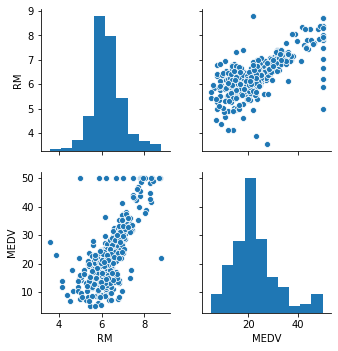

In [56]:
sns_plot = sns.pairplot(
    data[['RM', 'MEDV']])
sns_plot

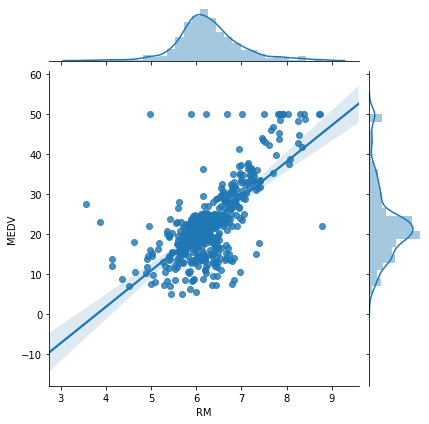

In [57]:
sns.jointplot(x='RM', y='MEDV', 
              data=data, kind='reg')

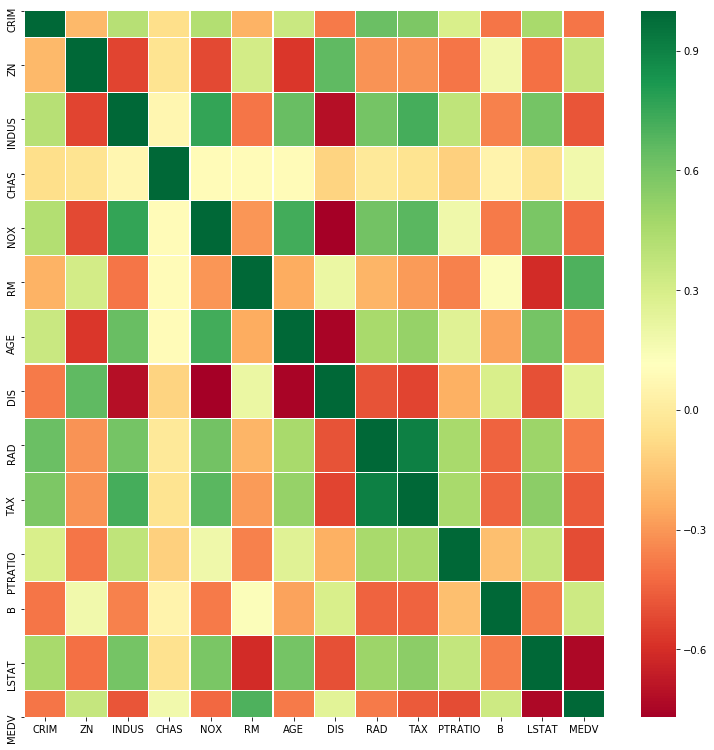

In [16]:
f, ax = plt.subplots(figsize=(13, 13))
corr = np.round_(data.corr(), decimals=2)
sns.heatmap(corr,annot=False,cmap='RdYlGn',linewidths=0.2)

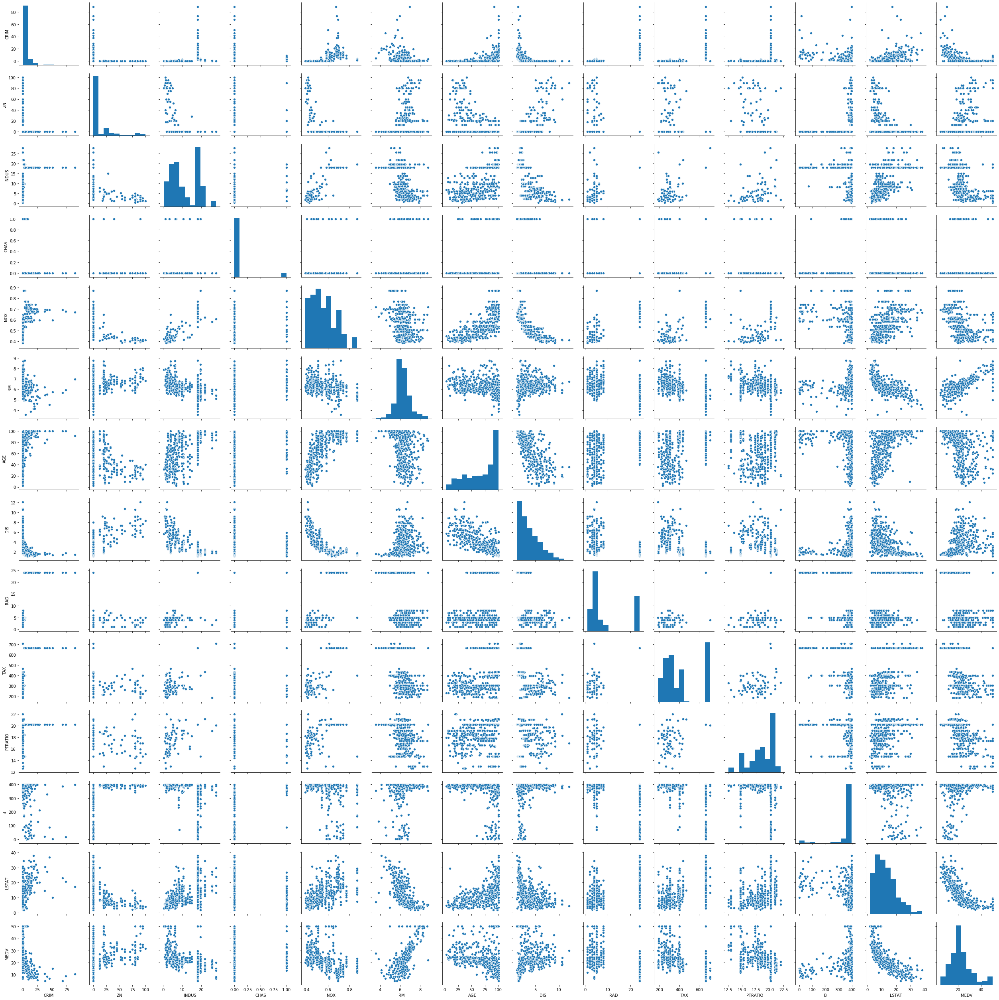

In [17]:
sns.pairplot(data)

### Для датасета boston

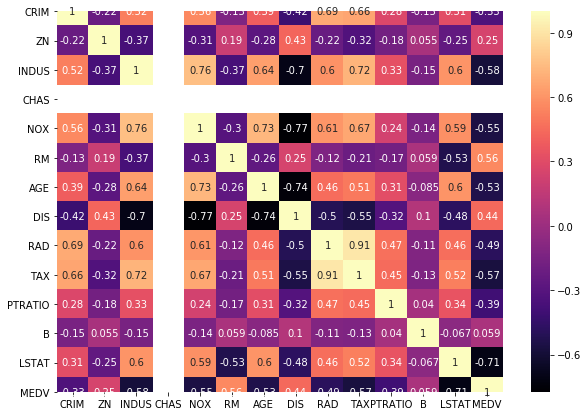

In [28]:
#Проверим корреляцию между переменными и удалим наиболее коррелированные.
#А ещё для датафрейма boston совместим расчёт и визуализацию.
plt.figure(figsize=(10,7))
sns.heatmap(boston.corr(), annot=True,cmap='magma')
#corr_m_boston = data.corr().round(2)
#corr_m_boston

Как и показало предупреждение, так и по карте видно, что RAD и TAX высоко скоррелированы. Ставку налога удалим, доступность магистралей оставим. Доступность важнее знать, чем какие-то дополнительные экономические штучки, как обывателю. Но, видимо налог и вычисляется по доступности жилья для автотранспорта.

In [30]:
boston=boston.drop('TAX', axis=1)

In [31]:
boston.shape

(506, 13)

## Проведём Линейную регрессию для первоначального датасета и датасета после обработки.

### Случай первоначального датасета data

In [32]:
from sklearn.linear_model import LinearRegression

Обучим нашу модель на всех столбцах, кроме неё самой. 13 столбцов это функции,а столбец 'MEDV' - наша цель.

In [33]:
X = data.drop( 'MEDV', axis = 1 )
y = data[ 'MEDV']
feature_names = X.columns
print(feature_names)
lm = LinearRegression()
lm

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT'],
      dtype='object')


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [34]:
lm.fit( X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [36]:
print( "Расчётный коэффициент перехвата: ", lm.intercept_ )
print( "Число коэфф: ", len( lm.coef_ )) 
print( "Коэфф = ", lm.coef_ )

Расчётный коэффициент перехвата:  36.45948838509008
Число коэфф:  13
Коэфф =  [-1.08011358e-01  4.64204584e-02  2.05586264e-02  2.68673382e+00
 -1.77666112e+01  3.80986521e+00  6.92224640e-04 -1.47556685e+00
  3.06049479e-01 -1.23345939e-02 -9.52747232e-01  9.31168327e-03
 -5.24758378e-01]


In [54]:
pd.DataFrame( zip(X.columns, lm.coef_),
            columns=['атрибуты', 'установленные коэффициенты'])

,атрибуты,установленные коэффициенты
0,CRIM,-0.156381
1,ZN,0.038549
2,INDUS,-0.025063
3,CHAS,0.786440
4,NOX,-12.946912
5,RM,4.002689
6,AGE,-0.011602
7,DIS,-1.368288
8,RAD,0.341757
9,TAX,-0.013515


Зависимость цены дома (MEDV) от среднего количества комнат (RM).

Text(0.5, 1.0, 'Цена vs. среднее количество Комнат')

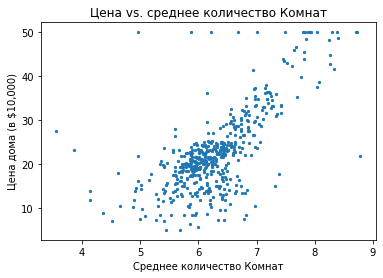

In [38]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.scatter( data.RM, data.MEDV, s=5 )
plt.xlabel( "Среднее количество Комнат" )
plt.ylabel( "Цена дома (в $10,000)" )
plt.title( "Цена vs. среднее количество Комнат")

## Прогнозируем цену.

In [39]:
lm.predict( X)[0:10]

array([30.00384338, 25.02556238, 30.56759672, 28.60703649, 27.94352423,
       25.25628446, 23.00180827, 19.53598843, 11.52363685, 18.92026211])

Text(0.5, 1.0, 'Реальные vs Предсказанные цены домов')

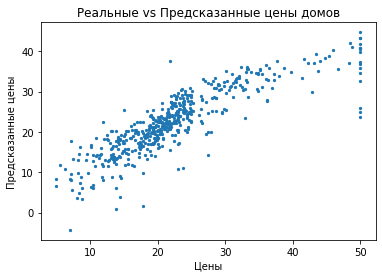

In [40]:
plt.scatter( data.MEDV, lm.predict(X), s=5 )
plt.xlabel( "Цены")
plt.ylabel( "Предсказанные цены")
plt.title( "Реальные vs Предсказанные цены домов")

In [41]:
mse = np.mean( (data.MEDV-lm.predict(X))**2)
print( "Среднеквадратичная ошибка = ", mse )

Среднеквадратичная ошибка =  21.894831181729227


## Обучение и проверка

In [42]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = \
     train_test_split( X,
                                              data.MEDV,
                                              test_size=0.33,
                                              random_state=5 )
print( X_train.shape, X_test.shape, y_train.shape, y_test.shape )

(339, 13) (167, 13) (339,) (167,)


Построение модели линейной регрессии с использованием только тренировочных данных:

In [43]:
lm = LinearRegression()
lm.fit( X_train, y_train )

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [44]:
pred_train = lm.predict( X_train )
pred_test  = lm.predict( X_test )
print( "mse_train = ", np.mean( (y_train-lm.predict(X_train))**2) )
print( "mse_test  = ", np.mean( (y_test-lm.predict(X_test))**2) )

mse_train =  19.54675847353468
mse_test  =  28.530458765974643


## Построение графиков невязки (остатка, ошибки).

Text(0, 0.5, 'Невязки')

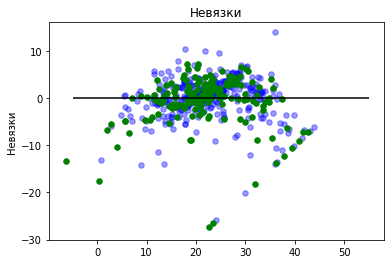

In [46]:
plt.scatter( lm.predict(X_train), lm.predict(X_train) - y_train,
           c ='b', s=30, alpha=0.4 )
plt.scatter( lm.predict(X_test), lm.predict(X_test) - y_test,
           c ='g', s=30 )
plt.hlines( y=0, xmin=-5, xmax=55)
plt.title( "Невязки" )
plt.ylabel( "Невязки" )

### Случай первоначального датасета boston (убрали часть данных и один из атрибутов)

In [73]:
from sklearn.linear_model import LinearRegression

In [74]:
boston

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,21.0,393.45,6.48,22.0


In [75]:
X_b = boston.drop( 'MEDV', axis = 1 )
y_b = boston[ 'MEDV']
feature_names_b = X_b.columns
print(feature_names_b)
lm_b = LinearRegression()
lm_b

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'PTRATIO', 'B', 'LSTAT'],
      dtype='object')


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [52]:
lm_b.fit( X_b, y_b)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [53]:
print( "Расчётный коэффициент перехвата: ", lm_b.intercept_ )
print( "Число коэфф: ", len( lm_b.coef_ )) 
print( "Коэфф = ", lm_b.coef_ )

Расчётный коэффициент перехвата:  21.763140172398774
Число коэфф:  12
Коэфф =  [ 2.31426162e-01  1.88956533e-02 -9.39661409e-02 -7.74380560e-15
 -6.20055003e+00  3.45575354e+00 -3.00262311e-02 -4.61986144e-01
 -1.32383053e-01 -3.51926822e-01 -8.49424182e-03 -2.86571820e-01]


In [55]:
pd.DataFrame( zip(X_b.columns, lm_b.coef_),
            columns=['атрибуты', 'установленные коэффициенты'])

,атрибуты,установленные коэффициенты
0,CRIM,2.314262e-01
1,ZN,1.889565e-02
2,INDUS,-9.396614e-02
3,CHAS,-7.743806e-15
4,NOX,-6.200550e+00
5,RM,3.455754e+00
6,AGE,-3.002623e-02
7,DIS,-4.619861e-01
8,RAD,-1.323831e-01
9,PTRATIO,-3.519268e-01


Text(0.5, 1.0, 'Цена vs. среднее количество Комнат')

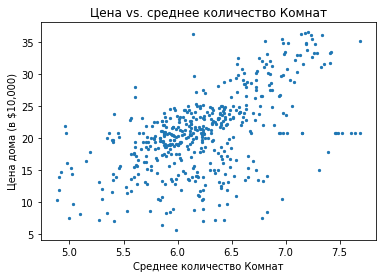

In [59]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.scatter( boston.RM, boston.MEDV, s=5 )
plt.xlabel( "Среднее количество Комнат" )
plt.ylabel( "Цена дома (в $10,000)" )
plt.title( "Цена vs. среднее количество Комнат")

## Прогнозируем цену **теперь для датасета boston**. 

In [61]:
lm_b.predict( X_b)[0:10]

array([27.11075708, 23.20295974, 27.87657129, 27.56065827, 27.12764534,
       24.56368271, 21.30492328, 18.86811032, 13.83407343, 18.97732858])

Text(0.5, 1.0, 'Реальные vs Предсказанные цены домов')

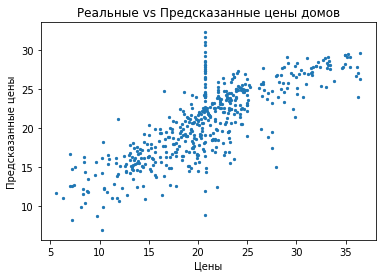

In [62]:
plt.scatter( boston.MEDV, lm_b.predict(X_b), s=5 )
plt.xlabel( "Цены")
plt.ylabel( "Предсказанные цены")
plt.title( "Реальные vs Предсказанные цены домов")

In [64]:
mse = np.mean( (boston.MEDV-lm_b.predict(X_b))**2)
print( "Среднеквадратичная ошибка = ", mse )

Среднеквадратичная ошибка =  14.326078980131678


*Среднеквадратичная ошибка уменьшилась.*

## Обучение и проверка датасета boston

In [71]:
from sklearn.model_selection import train_test_split
X_b_train, X_b_test, y_b_train, y_b_test = \
     train_test_split( X_b,
                                              boston.MEDV,
                                              test_size=0.33,
                                              random_state=5 )
print( X_b_train.shape, X_b_test.shape, y_b_train.shape, y_b_test.shape )

(339, 12) (167, 12) (339,) (167,)


Видно, имеем дело с одним атрибутом меньше.

Построение модели линейной регрессии с использованием только тренировочных данных:

In [78]:
X_b_train

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,PTRATIO,B,LSTAT
435,1.198341,0.000000,18.10,0.0,0.740,6.629000,94.6,2.124700,24.0,20.2,388.705711,23.27
88,0.056600,0.000000,3.41,0.0,0.489,7.007000,86.3,3.421700,2.0,17.8,396.900000,5.50
365,4.555870,0.000000,18.10,0.0,0.718,6.233212,87.9,1.613200,24.0,20.2,354.700000,7.12
242,0.102900,30.000000,4.93,0.0,0.428,6.358000,52.9,7.035500,6.0,16.6,372.750000,11.22
461,3.693110,0.000000,18.10,0.0,0.713,6.376000,88.4,2.567100,24.0,20.2,391.430000,14.65
...,...,...,...,...,...,...,...,...,...,...,...,...
486,5.691750,0.000000,18.10,0.0,0.583,6.114000,79.8,3.545900,24.0,20.2,392.680000,14.98
189,0.083700,3.192922,3.44,0.0,0.437,7.185000,38.9,4.566700,5.0,15.2,396.900000,5.39
495,0.178990,0.000000,9.69,0.0,0.585,5.670000,28.8,2.798600,6.0,19.2,393.290000,17.60
206,0.229690,0.000000,10.59,0.0,0.489,6.326000,52.5,4.354900,4.0,18.6,394.870000,10.97


In [79]:
y_b_train

435    13.4
88     23.6
365    27.5
242    22.2
461    17.7
       ... 
486    19.1
189    34.9
495    23.1
206    24.4
355    20.6
Name: MEDV, Length: 339, dtype: float64

In [76]:
lm_b = LinearRegression()
lm_b.fit( X_b_train, y_b_train )

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [80]:
pred_train = lm_b.predict( X_b_train )
pred_test  = lm_b.predict( X_b_test )
print( "mse_train = ", np.mean( (y_b_train-lm_b.predict(X_b_train))**2) )
print( "mse_test  = ", np.mean( (y_b_test-lm_b.predict(X_b_test))**2) )

mse_train =  15.10886633546779
mse_test  =  13.711010769829164


Среднеквадратичные ошибки уменьшились почти в два раза, по сравнению с первоначальным датасетом.

## Построение графиков невязки (остатка, ошибки).

Text(0, 0.5, 'Невязки')

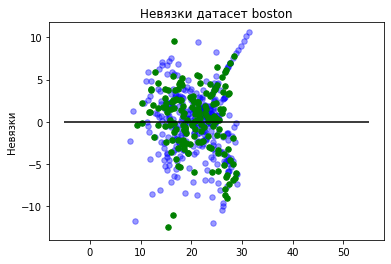

In [82]:
plt.scatter( lm_b.predict(X_b_train), lm_b.predict(X_b_train) - y_b_train,
           c ='b', s=30, alpha=0.4 )
plt.scatter( lm_b.predict(X_b_test), lm_b.predict(X_b_test) - y_b_test,
           c ='g', s=30 )
plt.hlines( y=0, xmin=-5, xmax=55)
plt.title( "Невязки датасет boston" )
plt.ylabel( "Невязки" )

Видно, что диапазон ошибок в этой моделе чуть меньше и симметричней относительно нуля.

### Ещё немного о двух датасетах.

data

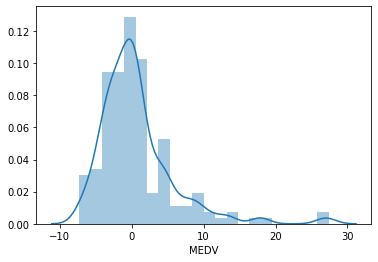

In [83]:
predict=lm.predict(X_test)
sns.distplot((y_test-predict))

boston

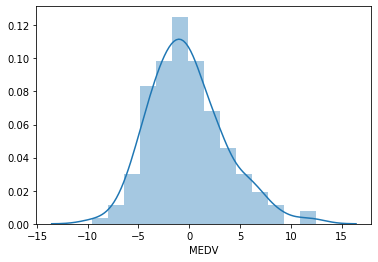

In [84]:
predict_b=lm_b.predict(X_b_test)
sns.distplot((y_b_test-predict_b))

Используем метрики.

In [87]:
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

data

In [88]:
print("R2: \t", r2_score(y_test, predict))
print("RMSE: \t", sqrt(mean_squared_error(y_test, predict)))
print("MAE: \t", mean_absolute_error(y_test, predict))

R2: 	 0.69565516561116
RMSE: 	 5.34139108903052
MAE: 	 3.4550349322483536


boston

In [89]:
print("R2: \t", r2_score(y_b_test, predict_b))
print("RMSE: \t", sqrt(mean_squared_error(y_b_test, predict_b)))
print("MAE: \t", mean_absolute_error(y_b_test, predict_b))

R2: 	 0.6591709369254628
RMSE: 	 3.702838204651826
MAE: 	 2.893982045378767


#### Общий вывод:  
грамотная подготовка данных минимизирует ошибки и точней строит предсказания.